##Parte I: Encontrar distribuição estatística que melhor modela o ambiente

### Leitura dos dados medidos - 8 taps e 20 taps

### Considera-se $P(t) = \sum_{i=0}{N-1}(|an|^2$), em que $a_n$ é a componente normalizada dos dados medidos.
### $P(t) = \sqrt{r(t)}$ em que $r(t)$ é a amplitude do sinal e $P(t)$ a potência do mesmo

In [230]:
import numpy as np
mypath = ["cirNTaps8SteamPlant.csv", "cirNTaps20SteamPlant.csv"]

# Para cada instante de tempo elevar as componentes elevadas ao quadrado e somar
def P_R(df, cols):
    P = []
    rows = np.arange(0, len(df))
    for row in rows:
            aux = sum((df[cols].values[row])**2)
            P.append(aux)
    return P

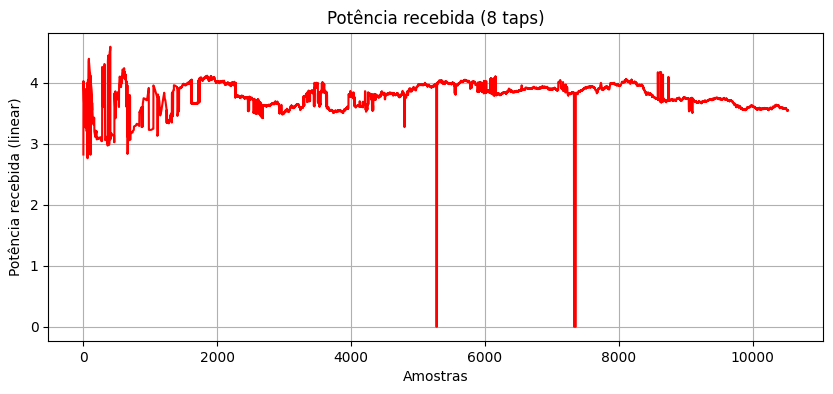

In [3]:
import matplotlib.pyplot as plt
import pandas as pd

# Geração do dataframe para o arquivo com número de taps indicado
df1 = pd.read_csv(mypath[0])
cols1 = df1.columns
P_R1 = P_R(df1, cols1) 
plt.figure(figsize=(10,4))
plt.plot(P_R1, color='red')
plt.ylabel("Potência recebida (linear)")
plt.xlabel("Amostras")
plt.title("Potência recebida (8 taps)")
plt.grid(True)
plt.show()

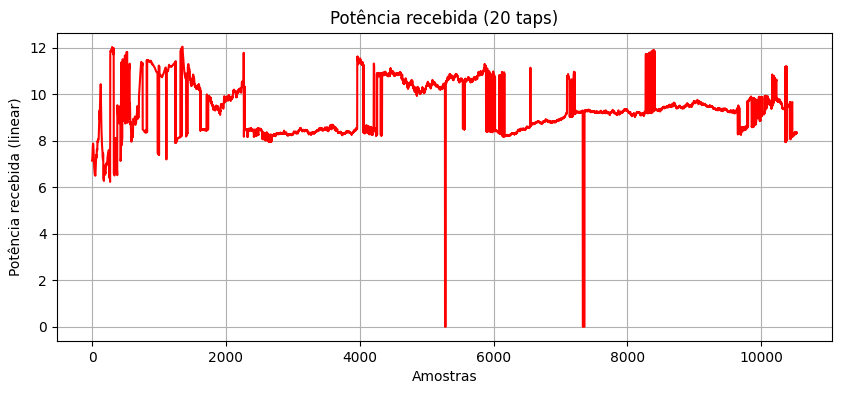

In [4]:
import matplotlib.pyplot as plt
import numpy as np

# Geração do dataframe para o arquivo com número de taps indicado
df2 = pd.read_csv(mypath[1])
cols2 = df2.columns
P_R2 = P_R(df2, cols2)
plt.figure(figsize=(10,4))
plt.plot(P_R2, color='red')
plt.ylabel("Potência recebida (linear)")
plt.xlabel("Amostras")
plt.title("Potência recebida (20 taps)")
plt.grid(True)
plt.show()

### Verificar a variação da média do sinal

### Sinal filtrado - 8 taps
## Filtro de Savitzky–Golay - usado para filtragem de um sinal com base em modelagem polinomial considerando uma janela móvel

### Filtro de Savitzky–Golay

### $y_f[i] = \sum_{k=-M}^{M} c_k \, y[i + k]$

### $c_k$: c coeficientes obtidos pela minimização do erro quadrático local; 

### $y$: sinal fornecido 

### $y_f$: sinal fornecido após a filtragem

Média original: 1.934
Desvio padrão original: 0.131
Média filtrada: 1.934
Desvio padrão filtrada: 0.053
Média residual: 0.000
Desvio padrão residual: 0.119


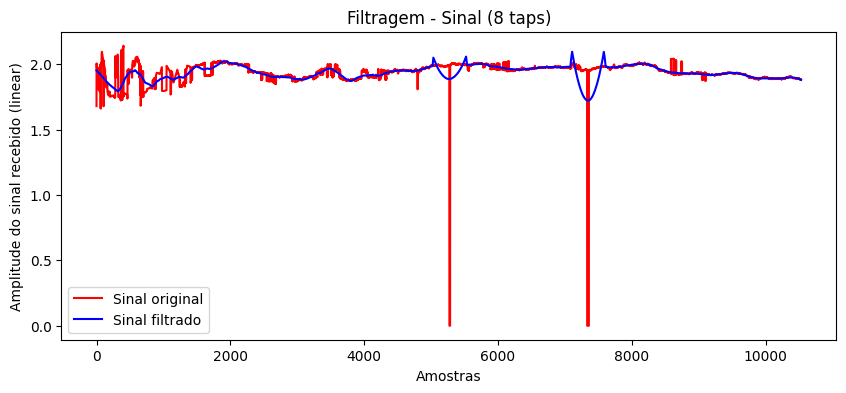

In [552]:
# Filtro Savgol
from scipy.signal import savgol_filter

w_len = 501
poly_order = 3
R1 = np.sqrt(P_R1) # sinal recebido obtido a partir da potência (R = sqrt(P))
R1_filt = savgol_filter(R1, window_length=w_len, polyorder=poly_order)

# Cálculo da média e desvio padrão das medidas
print(f"Média original: {np.mean(R1):.3f}")
print(f"Desvio padrão original: {np.std(R1):.3f}")
print(f"Média filtrada: {np.mean(R1_filt):.3f}")
print(f"Desvio padrão filtrada: {np.std(R1_filt):.3f}")
print(f"Média residual: {abs(np.mean(R1-R1_filt)):.3f}")
print(f"Desvio padrão residual: {np.std(R1-R1_filt):.3f}")

plt.figure(figsize=(10,4))
plt.plot(R1, label="Sinal original", color="red")
plt.plot(R1_filt, label=f"Sinal filtrado ({w_len} amostras", color='blue')
plt.xlabel('Amostras')
plt.ylabel('Amplitude do sinal recebido (linear)')
plt.title("Filtragem - Sinal (8 taps)")
plt.legend([f"Sinal original", f"Sinal filtrado"])
plt.show()



## Sinal filtrado - 20 taps

Média original: 3.048
Desvio padrão original: 0.252
Média filtrada: 3.048
Desvio padrão filtrada: 0.147
Média residual: 0.082
Desvio padrão residual: 0.205


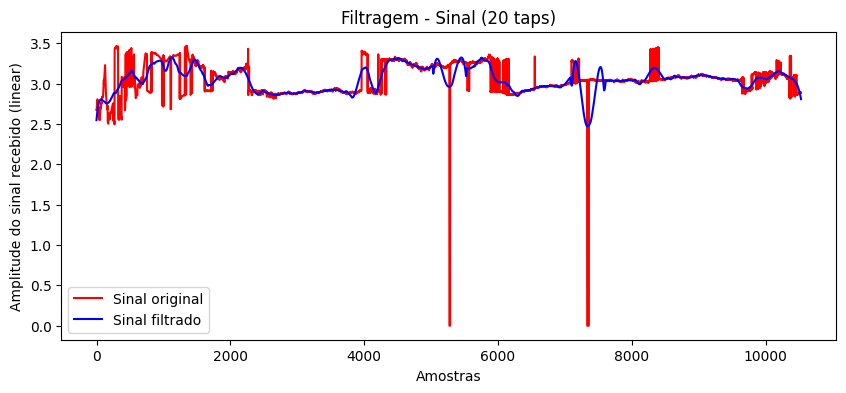

In [553]:

from scipy.signal import savgol_filter

w_len = 501 # 20% do número de amostras é um valor típico para escolha da janela
poly_order = 5
R2 = np.sqrt(P_R2) # sinal recebido obtido a partir da potência
R2_filt = savgol_filter(R2, window_length=w_len, polyorder=poly_order)

# Cálculo da média e desvio padrão das medidas
print(f"Média original: {np.mean(R2):.3f}")
print(f"Desvio padrão original: {np.std(R2):.3f}")
print(f"Média filtrada: {np.mean(R2_filt):.3f}")
print(f"Desvio padrão filtrada: {np.std(R2_filt):.3f}")
print(f"Média residual: {np.mean(abs(R2-R2_filt)):.3f}")
print(f"Desvio padrão residual: {np.std(R2-R2_filt):.3f}")

plt.figure(figsize=(10,4))
plt.plot(R2, label="Sinal original", color="red")
plt.plot(R2_filt, label=f"Sinal filtrado ({w_len} amostras", color='blue')
plt.xlabel('Amostras')
plt.ylabel('Amplitude do sinal recebido (linear)')
plt.title("Filtragem - Sinal (20 taps)")
plt.legend([f"Sinal original", f"Sinal filtrado"])
plt.show()


## Histograma das medidas filtradas - 8 taps

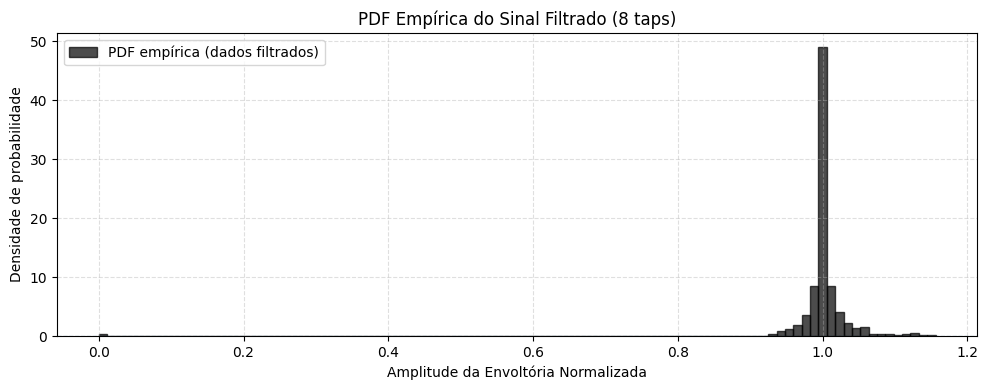

In [474]:
# === Cálculo da PDF empírica ===
num_bins = 100  # ajuste conforme o tamanho da amostra
pdf_vals, bin_edges = np.histogram(R1/R1_filt, bins=num_bins, density=True)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# === Plotagem ===
plt.figure(figsize=(10,4))
plt.bar(bin_centers, pdf_vals, width=bin_centers[1]-bin_centers[0], alpha=0.7, color='black', edgecolor='k', label='PDF empírica (dados filtrados)')

plt.axhline(0, linestyle='--', linewidth=0.8)
plt.xlabel('Amplitude da Envoltória Normalizada')
plt.ylabel('Densidade de probabilidade')
plt.title('PDF Empírica do Sinal Filtrado (8 taps)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

## Histograma das medidas filtradas - 20 taps

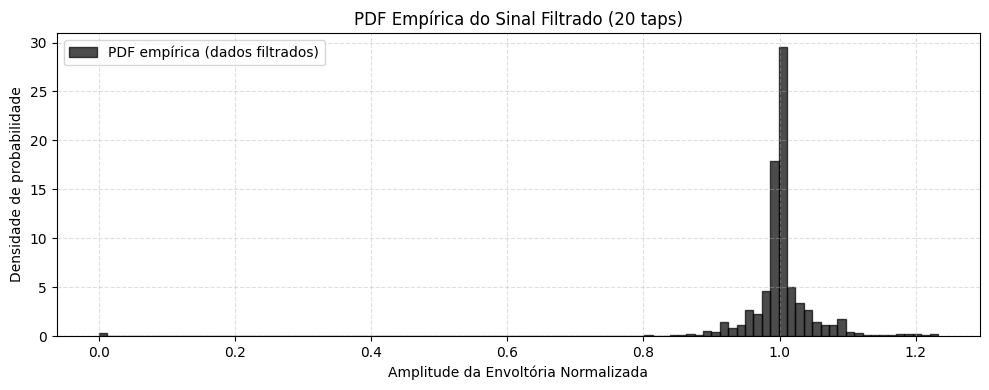

In [475]:
# === Cálculo da PDF empírica ===
num_bins = 100  # ajuste conforme o tamanho da amostra
pdf_vals, bin_edges = np.histogram(R2/R2_filt, bins=num_bins, density=True)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# === Plotagem ===
plt.figure(figsize=(10,4))
plt.bar(bin_centers, pdf_vals, width=bin_centers[1]-bin_centers[0], alpha=0.7, color='black', edgecolor='k', label='PDF empírica (dados filtrados)')

plt.axhline(0, linestyle='--', linewidth=0.8)
plt.xlabel(f'Amplitude da Envoltória Normalizada')
plt.ylabel('Densidade de probabilidade')
plt.title('PDF Empírica do Sinal Filtrado (20 taps)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

### CDF Empírica para o sinal obtido com 8 taps

## Rayleigh - obtenção de sigma (scale)

## Rice - obtenção de K e scale

## Nakagami - obtenção de m e scale

Parâmetros Rayleigh (fit): scale=0.710
Parâmetros Nakagami (fit): m=366.622, scale=1.004
Parâmetros Rice (fit): b=37.983, scale=0.026
Fator K (Rice): 721.356


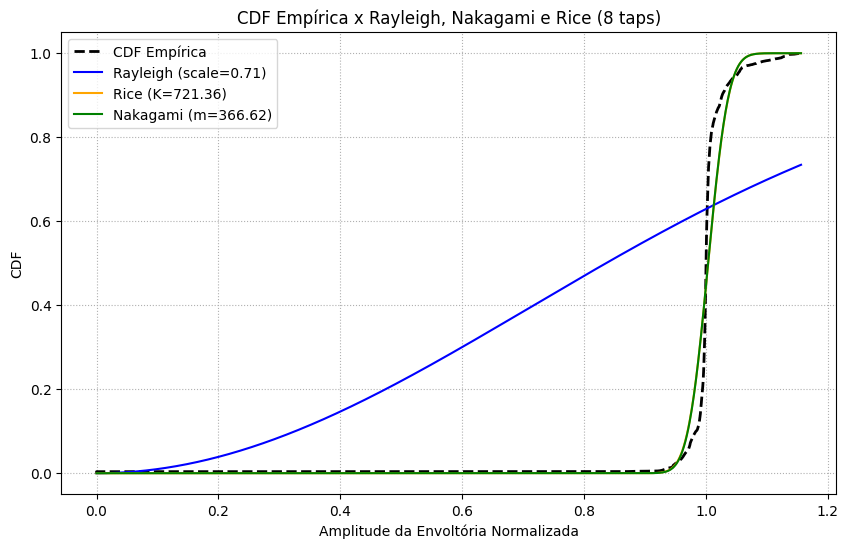

In [476]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import rayleigh, rice, nakagami
import matplotlib.pyplot as plt

# Módulo da amplitude do sinal normalizado
R_norm = R1/R1_filt
# --- CDF empírica ---

data_sorted = np.sort(R_norm)
R_ecdf = np.arange(1, len(data_sorted) + 1) / len(data_sorted)

R_norm_fit = R_norm[R_norm > 0] # remover r_norm igual a zero

# Rayleigh
r_ray_loc, r_ray_scale = rayleigh.fit(R_norm_fit, floc=0)
print(f"Parâmetros Rayleigh (fit): scale={r_ray_scale:.3f}")

# Nakagami
r_nk_m, r_nk_loc, r_nk_scale = nakagami.fit(R_norm_fit, floc=0)
print(f"Parâmetros Nakagami (fit): m={r_nk_m:.3f}, scale={r_nk_scale :.3f}")

# Rice
r_ri_b, r_ri_loc, r_ri_scale = rice.fit(R_norm_fit, floc=0)
K_rice_fit = (r_ri_b**2) / 2
print(f"Parâmetros Rice (fit): b={r_ri_b:.3f}, scale={r_ri_scale:.3f}")
print(f"Fator K (Rice): {K_rice_fit:.3f}")

x_axis = np.linspace(data_sorted.min(), data_sorted.max(), 1000)

cdf_ray_fit = rayleigh.cdf(x_axis, loc=r_ray_loc, scale=r_ray_scale)
cdf_nk_fit = nakagami.cdf(x_axis, r_nk_m, loc=r_nk_loc, scale=r_nk_scale)
cdf_rice_fit = rice.cdf(x_axis, r_ri_b, loc=r_ri_loc, scale=r_ri_scale)

# --- PLOT ---
plt.figure(figsize=(10, 6))
plt.plot(data_sorted, R_ecdf, label='CDF Empírica', color='black', linewidth=2, linestyle='--')
plt.plot(x_axis, cdf_ray_fit, label=f'Rayleigh (scale={r_ray_scale:.2f})', color='blue')
plt.plot(x_axis, cdf_rice_fit, label=f'Rice (K={K_rice_fit:.2f})', color='orange')
plt.plot(x_axis, cdf_nk_fit, label=f'Nakagami (m={r_nk_m:.2f})', color='green')
plt.title('CDF Empírica x Rayleigh, Nakagami e Rice (8 taps)')
plt.xlabel('Amplitude da Envoltória Normalizada')
plt.ylabel('CDF')
plt.legend()
plt.grid(True, linestyle=':')
plt.show()

### CDF Empírica para o sinal obtido com 20 taps

## Rayleigh - obtenção de sigma (scale)

## Rice - obtenção de K e scale

## Nakagami - obtenção de m e scale

Parâmetros Rayleigh (fit): loc=0.000, scale=0.710
Parâmetros Rice (fit): loc=0.000, b=23.068, scale=0.043
Fator K (Rice): 266.057
Parâmetros Nakagami (fit): loc=0.000, m=135.238, scale=1.005


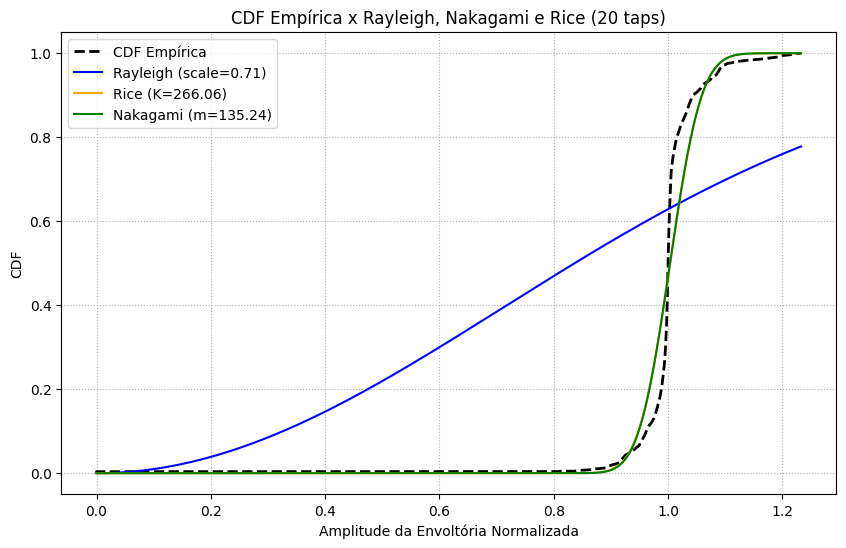

In [497]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import rayleigh, rice, nakagami
import matplotlib.pyplot as plt

# Módulo da amplitude do sinal normalizado
R_norm = R2/R2_filt
# --- CDF empírica ---

data_sorted = np.sort(R_norm)
R_ecdf = np.arange(1, len(data_sorted) + 1) / len(data_sorted)

R_norm_fit = R_norm[R_norm > 0] # remover r_norm igual a zero
#P_norm_fit = P_norm # remover r_norm igual a zero

# Rayleigh
r_ray_loc, r_ray_scale = rayleigh.fit(R_norm_fit, floc=0)
print(f"Parâmetros Rayleigh (fit): loc={r_ray_loc:.3f}, scale={r_ray_scale:.3f}")

# Rice
r_ri_b, r_ri_loc, r_ri_scale = rice.fit(R_norm_fit, floc=0)
K_rice_fit = (r_ri_b**2) / 2
print(f"Parâmetros Rice (fit): loc={r_ri_loc:.3f}, b={r_ri_b:.3f}, scale={r_ri_scale:.3f}")
print(f"Fator K (Rice): {K_rice_fit:.3f}")

# Nakagami
r_nk_m, r_nk_loc, r_nk_scale = nakagami.fit(R_norm_fit, floc=0)
print(f"Parâmetros Nakagami (fit): loc={r_nk_loc:.3f}, m={r_nk_m:.3f}, scale={r_nk_scale :.3f}")

x_axis = np.linspace(data_sorted.min(), data_sorted.max(), 1000)

cdf_ray_fit = rayleigh.cdf(x_axis, loc=r_ray_loc, scale=r_ray_scale)
cdf_nk_fit = nakagami.cdf(x_axis, r_nk_m, loc=r_nk_loc, scale=r_nk_scale)
cdf_rice_fit = rice.cdf(x_axis, r_ri_b, loc=r_ri_loc, scale=r_ri_scale)

# --- PLOT ---
plt.figure(figsize=(10, 6))
plt.plot(data_sorted, R_ecdf, label='CDF Empírica', color='black', linewidth=2, linestyle='--')
plt.plot(x_axis, cdf_ray_fit, label=f'Rayleigh (scale={r_ray_scale:.2f})', color='blue')
plt.plot(x_axis, cdf_rice_fit, label=f'Rice (K={K_rice_fit:.2f})', color='orange')
plt.plot(x_axis, cdf_nk_fit, label=f'Nakagami (m={r_nk_m:.2f})', color='green')
plt.title('CDF Empírica x Rayleigh, Nakagami e Rice (20 taps)')
plt.xlabel('Amplitude da Envoltória Normalizada')
plt.ylabel('CDF')
plt.legend()
plt.grid(True, linestyle=':')
plt.show()

## Plotar CDFs das medidas e das 3 distribuições de envoltória normalizada ρ conforme descrito no Capítulo 2 da dissertação https://repositorio.unb.br/handle/10482/11357. Usar os estimadores descritos na Seção 4.2 para plotar as distribuições de Rice e Nakagami. Comparar com modelos obtidos na tarefa 4.

## Comparação: CDF Empírica x Distribuições Normalizadas (Rayleigh, Rice e Nakagami) (8 taps)

loc_ray 0.8894589024962654
sigma ray 0.11349824109945045
sigma naka 0.053933770441566
m 343.778280764719
B 37.04203551084
sigma ri 0.026996356604305924


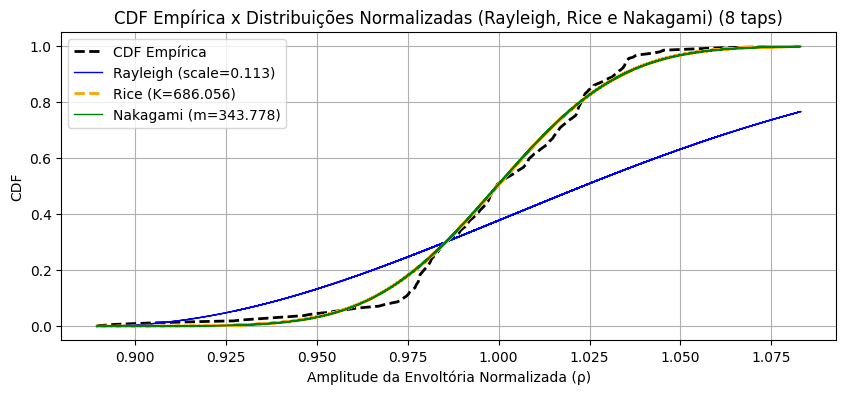

In [504]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import rayleigh, rice, nakagami
import matplotlib.pyplot as plt
import numpy as np
from scipy.special import gammaincc
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import rice
import marcumq

# --- CDF empírica ---

# Utilizamos o valor do sinal filtrado normalizado pela potência
R = np.abs(R1_filt) 

Er2 = np.sqrt(np.mean(R**2)) 
rho = R / Er2
data_sorted = np.sort(rho)
R_ecdf = np.arange(1, len(data_sorted) + 1) / len(data_sorted)

# Rayleigh
# Consideramos um deslocamento de loc para que a distribuição de Rayleigh comece em zero e 
# a escala horizontal fique de acordo com as demais distribuições
# Parâmetros.
loc_ray1= rho.min()
Er2_desloc = np.mean((rho - loc_ray1)**2) 
sigma_ray = np.sqrt(Er2_desloc) 
#sigma_ray = sigma_benv
print('loc_ray', loc_ray1)
# CDF Rayleigh
cdf_rayleigh_manual = 1 - np.exp(-(rho - loc_ray1)**2 / (2 * sigma_ray**2))

# Nakagami

# Parâmetros
m = 1/np.var(rho**2)

# CDF Nakagami
cdf_nakagami_manual = 1 - gammaincc(m, m * rho**2)
Omega = np.mean(rho**2)
sigma_nk = np.sqrt(Omega/m)

# Parâmetros
K = np.sqrt(m**2 -m) / (m -np.sqrt(m**2 -m))
v = 1 # Assuming v = 1
a = np.sqrt(2*K)
b = np.sqrt(2*(1+K))*rho
B = np.sqrt(2*K)
sigma_ri = v/B


# CDF Rice
Q1 = marcumq.marcumq(v, a, b)
cdf_rice_manual = 1 - Q1


# Rice
print('sigma ray', sigma_ray)
print('sigma naka', sigma_nk)
print('m', m)
print('B', B)
print('sigma ri', sigma_ri)

plt.figure(figsize=(10,4))
plt.plot(data_sorted, R_ecdf, 'k--', lw=2, label='CDF Empírica')
plt.plot(rho, cdf_rayleigh_manual, color='blue', lw=1, label=f'Rayleigh (scale={sigma_ray:.3f})')
plt.plot(rho, cdf_rice_manual, '--', color='orange', lw=2, label=f'Rice (K={K:.3f})')
plt.plot(rho, cdf_nakagami_manual, color='green', lw=1, label=f'Nakagami (m={m:.3f})')
plt.ylabel("CDF")
plt.xlabel("Amplitude da Envoltória Normalizada (ρ)")
#plt.xlim([0.8,1.1])
plt.legend()
plt.title("CDF Empírica x Distribuições Normalizadas (Rayleigh, Rice e Nakagami) (8 taps)")
plt.grid(True)
plt.show()


## Comparação: CDF Empírica x Distribuições Normalizadas (Rayleigh, Rice e Nakagami) (20 taps)

loc ray 0.8097118031958018
sigma ray 0.19513634159796173
sigma naka 0.09493434890265622
m 110.95662741224513
B 20.995814971216742
sigma ri 0.047628539371817886


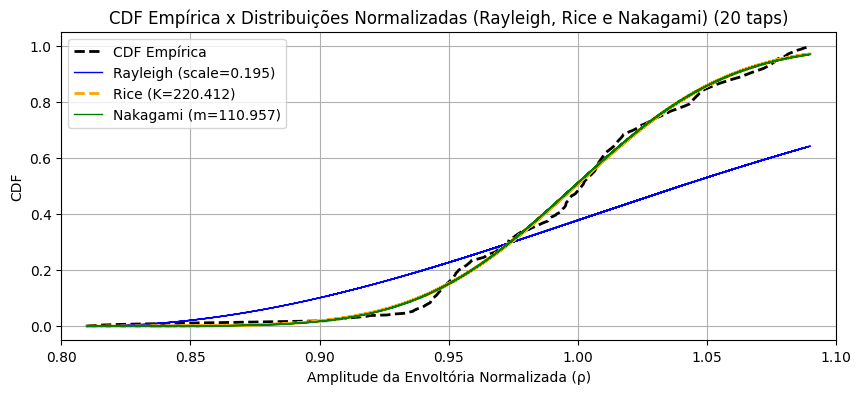

In [506]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import rayleigh, rice, nakagami
import matplotlib.pyplot as plt
import numpy as np
from scipy.special import gammaincc
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import rice
import marcumq

# --- CDF empírica ---

# Utilizamos o valor do sinal filtrado normalizado pela potência
R = np.abs(R2_filt) 

Er2 = np.sqrt(np.mean(R**2)) 
rho = R / Er2
data_sorted = np.sort(rho)
R_ecdf = np.arange(1, len(data_sorted) + 1) / len(data_sorted)

# Rayleigh
# Consideramos um deslocamento de loc para que a distribuição de Rayleigh comece em zero e 
# a escala horizontal fique de acordo com as demais distribuições
# Parâmetros.
loc_ray2 = rho.min()
Er2_desloc = np.mean((rho - loc_ray2)**2) 
sigma_ray = np.sqrt(Er2_desloc) 
#sigma_ray = sigma_benv

print('loc ray', loc_ray2)
# CDF Rayleigh
cdf_rayleigh_manual = 1 - np.exp(-(rho - loc_ray2)**2 / (2 * sigma_ray**2))

# Nakagami

# Parâmetros
m = 1/np.var(rho**2)

# CDF Nakagami
cdf_nakagami_manual = 1 - gammaincc(m, m * rho**2)
Omega = np.mean(rho**2)
sigma_nk = np.sqrt(Omega/m)

# Parâmetros
K = np.sqrt(m**2 -m) / (m -np.sqrt(m**2 -m))
v = 1 # Assuming v = 1
a = np.sqrt(2*K)
b = np.sqrt(2*(1+K))*rho
B = np.sqrt(2*K)
sigma_ri = v/B


# CDF Rice
Q1 = marcumq.marcumq(v, a, b)
cdf_rice_manual = 1 - Q1


# Rice
print('sigma ray', sigma_ray)
print('sigma naka', sigma_nk)
print('m', m)
print('B', B)
print('sigma ri', sigma_ri)

plt.figure(figsize=(10,4))
plt.plot(data_sorted, R_ecdf, 'k--', lw=2, label='CDF Empírica')
plt.plot(rho, cdf_rayleigh_manual, color='blue', lw=1, label=f'Rayleigh (scale={sigma_ray:.3f})')
plt.plot(rho, cdf_rice_manual, '--', color='orange', lw=2, label=f'Rice (K={K:.3f})')
plt.plot(rho, cdf_nakagami_manual, color='green', lw=1, label=f'Nakagami (m={m:.3f})')
plt.ylabel("CDF")
plt.xlabel("Amplitude da Envoltória Normalizada (ρ)")
plt.xlim([0.8,1.1])
plt.legend()
plt.title("CDF Empírica x Distribuições Normalizadas (Rayleigh, Rice e Nakagami) (20 taps)")
plt.grid(True)
plt.show()

### Criar rotina para gerar amostras de desvanecimento para as 3 distribuições e mostrar exemplos

### Exemplo 1: Parâmetros obtidos com o ajuste para 8 taps

Amostras geradas - Rayleigh: 5000 amostras. Parâmetros: scale=0.710
Amostras geradas - Rice: 5000 amostras. Parâmetros: b=37.970 e scale=0.026
Amostras geradas - Nakagami: 5000 amostras. Parâmetros: m=366.386 e scale=1.004


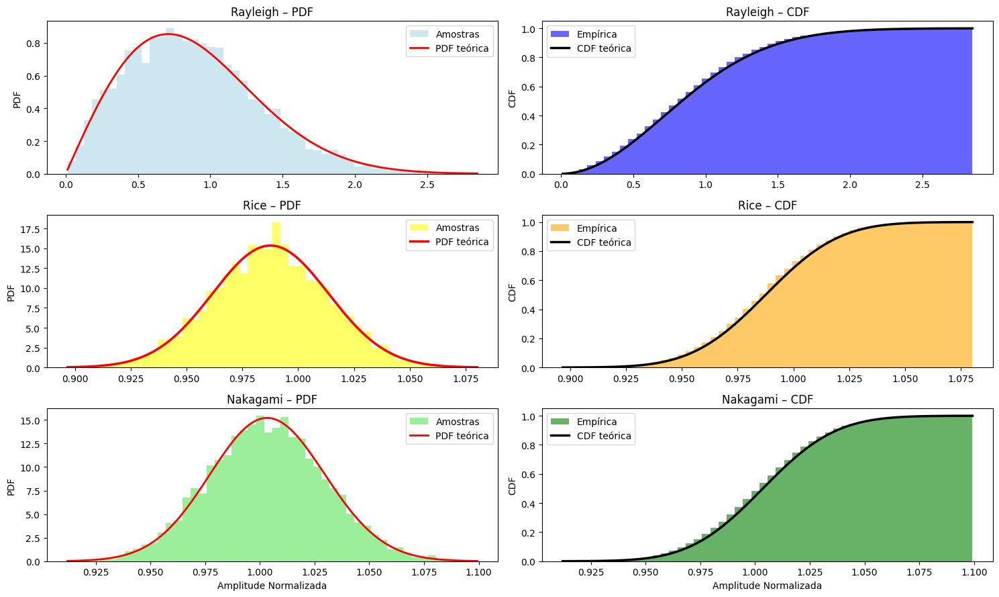

In [514]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import rayleigh, rice, nakagami

# -----------------------------------------------------
# 1. Paramêtros
# -----------------------------------------------------
params_rayleigh = (0, 0.71)        # (loc, scale)
params_rice = (37.97, 0, 0.026)           # (b, loc, scale)
params_nakagami = (366.386, 0, 1.004)   # (m, loc, scale)
n_samples = 5000

# -----------------------------------------------------
# 2. Geração de amostras
# -----------------------------------------------------
R_rayleigh = rayleigh.rvs(loc=params_rayleigh[0],
                          scale=params_rayleigh[1],
                          size=n_samples)
R_rice = rice.rvs(params_rice[0],
                  loc=params_rice[1],
                  scale=params_rice[2],
                  size=n_samples)
R_nakagami = nakagami.rvs(params_nakagami[0],
                          loc=params_nakagami[1],
                          scale=params_nakagami[2],
                          size=n_samples)

# Print - amostras geradas
print(f"Amostras geradas - Rayleigh: {n_samples} amostras. Parâmetros: scale={params_rayleigh[1]:.3f}")
print(f"Amostras geradas - Rice: {n_samples} amostras. Parâmetros: b={params_rice[0]:.3f} e scale={params_rice[2]:.3f}")
print(f"Amostras geradas - Nakagami: {n_samples} amostras. Parâmetros: m={params_nakagami[0]:.3f} e scale={params_nakagami[2]:.3f}")

# -----------------------------------------------------
# 3. Plotting range
# -----------------------------------------------------
x_rayleigh = np.linspace(min(R_rayleigh), max(R_rayleigh), 500)
x_rice = np.linspace(min(R_rice), max(R_rice), 500)
x_nakagami = np.linspace(min(R_nakagami), max(R_nakagami), 500)

# -----------------------------------------------------
# 4. PDFs e CDFs teóricas
# -----------------------------------------------------
pdf_rayleigh = rayleigh.pdf(x_rayleigh, *params_rayleigh)
cdf_rayleigh = rayleigh.cdf(x_rayleigh, *params_rayleigh)

pdf_rice = rice.pdf(x_rice, *params_rice)
cdf_rice = rice.cdf(x_rice, *params_rice)

pdf_nakagami = nakagami.pdf(x_nakagami, *params_nakagami)
cdf_nakagami = nakagami.cdf(x_nakagami, *params_nakagami)

# -----------------------------------------------------
# 5. Plot histogramas e CDFs
# -----------------------------------------------------
plt.figure(figsize=(15, 9))

# --- Rayleigh ---
plt.subplot(3, 2, 1)
plt.hist(R_rayleigh, bins=50, density=True, alpha=0.6, color='lightblue', label='Amostras')
plt.plot(x_rayleigh, pdf_rayleigh, 'r-', lw=2, label='PDF teórica')
plt.ylabel("PDF")
plt.title('Rayleigh – PDF')
plt.legend()

plt.subplot(3, 2, 2)
plt.hist(R_rayleigh, bins=50, density=True, cumulative=True, alpha=0.6, color='blue', label='Empírica')
plt.plot(x_rayleigh, cdf_rayleigh, 'k-', lw=2.5, label='CDF teórica')
plt.ylabel("CDF")
plt.title('Rayleigh – CDF')
plt.legend()

# --- Rice ---
plt.subplot(3, 2, 3)
plt.hist(R_rice, bins=50, density=True, alpha=0.6, color='yellow', label='Amostras')
plt.plot(x_rice, pdf_rice, 'r-', lw=2.5, label='PDF teórica')
plt.ylabel("PDF")
plt.title('Rice – PDF')
plt.legend()

plt.subplot(3, 2, 4)
plt.hist(R_rice, bins=50, density=True, cumulative=True, alpha=0.6, color='orange', label='Empírica')
plt.plot(x_rice, cdf_rice, 'k-', lw=2.5, label='CDF teórica')
plt.ylabel("CDF")
plt.title('Rice – CDF')
plt.legend()

# --- Nakagami ---
plt.subplot(3, 2, 5)
plt.hist(R_nakagami, bins=50, density=True, alpha=0.9, color='lightgreen', label='Amostras')
plt.plot(x_nakagami, pdf_nakagami, 'r-', lw=2, label='PDF teórica')
plt.ylabel("PDF")
plt.xlabel("Amplitude Normalizada")
plt.title('Nakagami – PDF')
plt.legend()

plt.subplot(3, 2, 6)
plt.hist(R_nakagami, bins=50, density=True, cumulative=True, alpha=0.6, color='green', label='Empírica')
plt.plot(x_nakagami, cdf_nakagami, 'k-', lw=2.5, label='CDF teórica')
plt.ylabel("CDF")
plt.xlabel("Amplitude Normalizada")
plt.title('Nakagami – CDF')
plt.legend()
    
plt.tight_layout()
plt.show()



### Exemplo 2: Parâmetros obtidos com o ajuste para 20 taps

Amostras geradas - Rayleigh: 5000 amostras. Parâmetros: scale=0.710
Amostras geradas - Rice: 5000 amostras. Parâmetros: b=23.070 e scale=0.043
Amostras geradas - Nakagami: 5000 amostras. Parâmetros: m=135.270 e scale=1.005


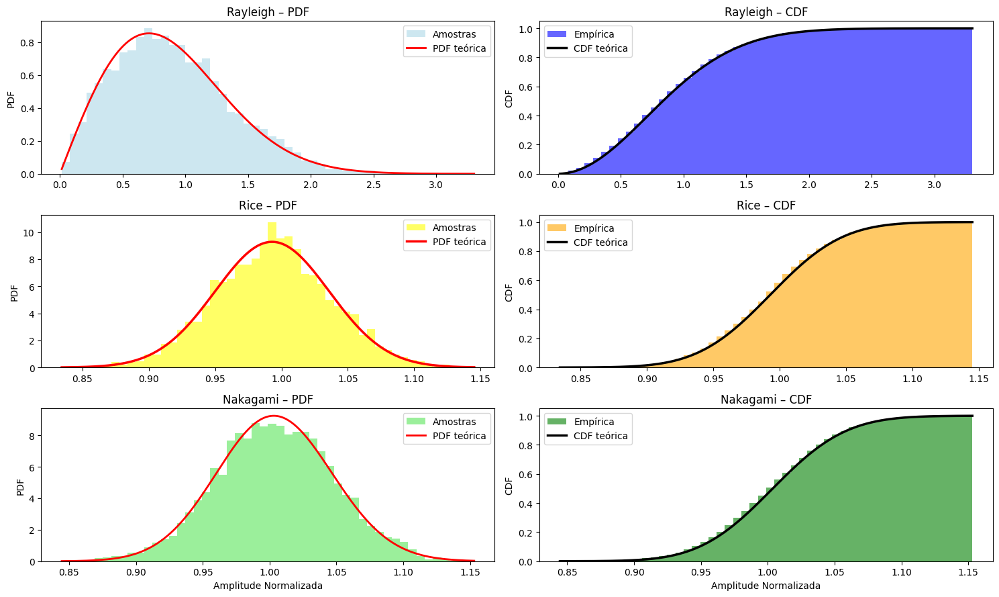

In [515]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import rayleigh, rice, nakagami

# -----------------------------------------------------
# 1. Paramêtros
# -----------------------------------------------------
params_rayleigh = (0, 0.71)        # (loc, scale)
params_rice = (23.07, 0, 0.043)           # (b, loc, scale)
params_nakagami = (135.27, 0, 1.005)   # (m, loc, scale)
n_samples = 5000

# -----------------------------------------------------
# 2. Geração de amostras
# -----------------------------------------------------
R_rayleigh = rayleigh.rvs(loc=params_rayleigh[0],
                          scale=params_rayleigh[1],
                          size=n_samples)
R_rice = rice.rvs(params_rice[0],
                  loc=params_rice[1],
                  scale=params_rice[2],
                  size=n_samples)
R_nakagami = nakagami.rvs(params_nakagami[0],
                          loc=params_nakagami[1],
                          scale=params_nakagami[2],
                          size=n_samples)

# Print - amostras geradas
print(f"Amostras geradas - Rayleigh: {n_samples} amostras. Parâmetros: scale={params_rayleigh[1]:.3f}")
print(f"Amostras geradas - Rice: {n_samples} amostras. Parâmetros: b={params_rice[0]:.3f} e scale={params_rice[2]:.3f}")
print(f"Amostras geradas - Nakagami: {n_samples} amostras. Parâmetros: m={params_nakagami[0]:.3f} e scale={params_nakagami[2]:.3f}")

# -----------------------------------------------------
# 3. Plotting range
# -----------------------------------------------------
x_rayleigh = np.linspace(min(R_rayleigh), max(R_rayleigh), 500)
x_rice = np.linspace(min(R_rice), max(R_rice), 500)
x_nakagami = np.linspace(min(R_nakagami), max(R_nakagami), 500)

# -----------------------------------------------------
# 4. PDFs e CDFs teóricas
# -----------------------------------------------------
pdf_rayleigh = rayleigh.pdf(x_rayleigh, *params_rayleigh)
cdf_rayleigh = rayleigh.cdf(x_rayleigh, *params_rayleigh)

pdf_rice = rice.pdf(x_rice, *params_rice)
cdf_rice = rice.cdf(x_rice, *params_rice)

pdf_nakagami = nakagami.pdf(x_nakagami, *params_nakagami)
cdf_nakagami = nakagami.cdf(x_nakagami, *params_nakagami)

# -----------------------------------------------------
# 5. Plot histogramas e CDFs
# -----------------------------------------------------
plt.figure(figsize=(15, 9))

# --- Rayleigh ---
plt.subplot(3, 2, 1)
plt.hist(R_rayleigh, bins=50, density=True, alpha=0.6, color='lightblue', label='Amostras')
plt.plot(x_rayleigh, pdf_rayleigh, 'r-', lw=2, label='PDF teórica')
plt.ylabel("PDF")
plt.title('Rayleigh – PDF')
plt.legend()

plt.subplot(3, 2, 2)
plt.hist(R_rayleigh, bins=50, density=True, cumulative=True, alpha=0.6, color='blue', label='Empírica')
plt.plot(x_rayleigh, cdf_rayleigh, 'k-', lw=2.5, label='CDF teórica')
plt.ylabel("CDF")
plt.title('Rayleigh – CDF')
plt.legend()

# --- Rice ---
plt.subplot(3, 2, 3)
plt.hist(R_rice, bins=50, density=True, alpha=0.6, color='yellow', label='Amostras')
plt.plot(x_rice, pdf_rice, 'r-', lw=2.5, label='PDF teórica')
plt.ylabel("PDF")
plt.title('Rice – PDF')
plt.legend()

plt.subplot(3, 2, 4)
plt.hist(R_rice, bins=50, density=True, cumulative=True, alpha=0.6, color='orange', label='Empírica')
plt.plot(x_rice, cdf_rice, 'k-', lw=2.5, label='CDF teórica')
plt.ylabel("CDF")
plt.title('Rice – CDF')
plt.legend()

# --- Nakagami ---
plt.subplot(3, 2, 5)
plt.hist(R_nakagami, bins=50, density=True, alpha=0.9, color='lightgreen', label='Amostras')
plt.plot(x_nakagami, pdf_nakagami, 'r-', lw=2, label='PDF teórica')
plt.ylabel("PDF")
plt.xlabel("Amplitude Normalizada")
plt.title('Nakagami – PDF')
plt.legend()

plt.subplot(3, 2, 6)
plt.hist(R_nakagami, bins=50, density=True, cumulative=True, alpha=0.6, color='green', label='Empírica')
plt.plot(x_nakagami, cdf_nakagami, 'k-', lw=2.5, label='CDF teórica')
plt.ylabel("CDF")
plt.xlabel("Amplitude Normalizada")
plt.title('Nakagami – CDF')
plt.legend()

plt.tight_layout()
plt.show()


### Exemplo 3: Parâmetros obtidos com o ajuste para 8 taps (params. normalização da envoltória)

Amostras geradas - Rayleigh: 5000 amostras. Parâmetros: scale=0.110
Amostras geradas - Rice: 5000 amostras. Parâmetros: b=37.021 e scale=0.027
Amostras geradas - Nakagami: 5000 amostras. Parâmetros: m=343.780 e scale=0.054


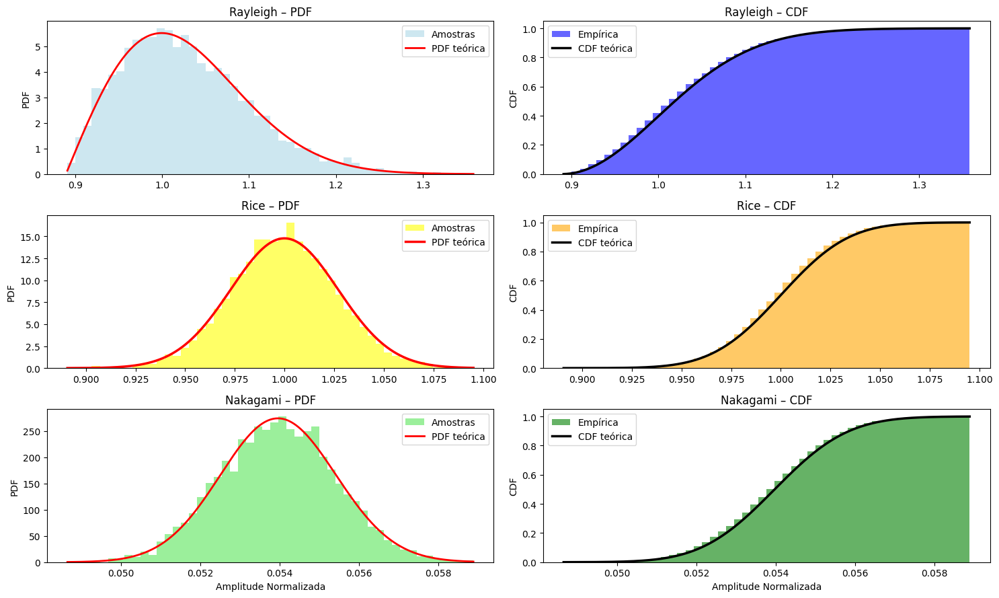

In [510]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import rayleigh, rice, nakagami

# -----------------------------------------------------
# 1. Paramêtros
# -----------------------------------------------------
params_rayleigh = (loc_ray1, 0.11)        # (loc, scale)
params_rice = (37.021, 0, 0.027)           # (b, loc, scale)
params_nakagami = (343.78, 0, 0.054)   # (m, loc, scale)
n_samples = 5000

# -----------------------------------------------------
# 2. Geração de amostras
# -----------------------------------------------------
R_rayleigh = rayleigh.rvs(loc=params_rayleigh[0],
                          scale=params_rayleigh[1],
                          size=n_samples)
R_rice = rice.rvs(params_rice[0],
                  loc=params_rice[1],
                  scale=params_rice[2],
                  size=n_samples)
R_nakagami = nakagami.rvs(params_nakagami[0],
                          loc=params_nakagami[1],
                          scale=params_nakagami[2],
                          size=n_samples)

# Print - amostras geradas
print(f"Amostras geradas - Rayleigh: {n_samples} amostras. Parâmetros: scale={params_rayleigh[1]:.3f}")
print(f"Amostras geradas - Rice: {n_samples} amostras. Parâmetros: b={params_rice[0]:.3f} e scale={params_rice[2]:.3f}")
print(f"Amostras geradas - Nakagami: {n_samples} amostras. Parâmetros: m={params_nakagami[0]:.3f} e scale={params_nakagami[2]:.3f}")

# -----------------------------------------------------
# 3. Plotting range
# -----------------------------------------------------
x_rayleigh = np.linspace(min(R_rayleigh), max(R_rayleigh), 500)
x_rice = np.linspace(min(R_rice), max(R_rice), 500)
x_nakagami = np.linspace(min(R_nakagami), max(R_nakagami), 500)

# -----------------------------------------------------
# 4. PDFs e CDFs teóricas
# -----------------------------------------------------
pdf_rayleigh = rayleigh.pdf(x_rayleigh, *params_rayleigh)
cdf_rayleigh = rayleigh.cdf(x_rayleigh, *params_rayleigh)

pdf_rice = rice.pdf(x_rice, *params_rice)
cdf_rice = rice.cdf(x_rice, *params_rice)

pdf_nakagami = nakagami.pdf(x_nakagami, *params_nakagami)
cdf_nakagami = nakagami.cdf(x_nakagami, *params_nakagami)

# -----------------------------------------------------
# 5. Plot histogramas e CDFs
# -----------------------------------------------------
plt.figure(figsize=(15, 9))

# --- Rayleigh ---
plt.subplot(3, 2, 1)
plt.hist(R_rayleigh, bins=50, density=True, alpha=0.6, color='lightblue', label='Amostras')
plt.plot(x_rayleigh, pdf_rayleigh, 'r-', lw=2, label='PDF teórica')
plt.ylabel("PDF")
plt.title('Rayleigh – PDF')
plt.legend()

plt.subplot(3, 2, 2)
plt.hist(R_rayleigh, bins=50, density=True, cumulative=True, alpha=0.6, color='blue', label='Empírica')
plt.plot(x_rayleigh, cdf_rayleigh, 'k-', lw=2.5, label='CDF teórica')
plt.ylabel("CDF")
plt.title('Rayleigh – CDF')
plt.legend()

# --- Rice ---
plt.subplot(3, 2, 3)
plt.hist(R_rice, bins=50, density=True, alpha=0.6, color='yellow', label='Amostras')
plt.plot(x_rice, pdf_rice, 'r-', lw=2.5, label='PDF teórica')
plt.ylabel("PDF")
plt.title('Rice – PDF')
plt.legend()

plt.subplot(3, 2, 4)
plt.hist(R_rice, bins=50, density=True, cumulative=True, alpha=0.6, color='orange', label='Empírica')
plt.plot(x_rice, cdf_rice, 'k-', lw=2.5, label='CDF teórica')
plt.ylabel("CDF")
plt.title('Rice – CDF')
plt.legend()

# --- Nakagami ---
plt.subplot(3, 2, 5)
plt.hist(R_nakagami, bins=50, density=True, alpha=0.9, color='lightgreen', label='Amostras')
plt.plot(x_nakagami, pdf_nakagami, 'r-', lw=2, label='PDF teórica')
plt.ylabel("PDF")
plt.xlabel("Amplitude Normalizada")
plt.title('Nakagami – PDF')
plt.legend()

plt.subplot(3, 2, 6)
plt.hist(R_nakagami, bins=50, density=True, cumulative=True, alpha=0.6, color='green', label='Empírica')
plt.plot(x_nakagami, cdf_nakagami, 'k-', lw=2.5, label='CDF teórica')
plt.ylabel("CDF")
plt.xlabel("Amplitude Normalizada")
plt.title('Nakagami – CDF')
plt.legend()

plt.tight_layout()
plt.show()


### Exemplo 4: Parâmetros obtidos com o ajuste para 20 taps (params. normalização da envoltória)

Amostras geradas - Rayleigh: 5000 amostras. Parâmetros: scale=0.120
Amostras geradas - Rice: 5000 amostras. Parâmetros: b=20.990 e scale=0.053
Amostras geradas - Nakagami: 5000 amostras. Parâmetros: m=110.890 e scale=0.054


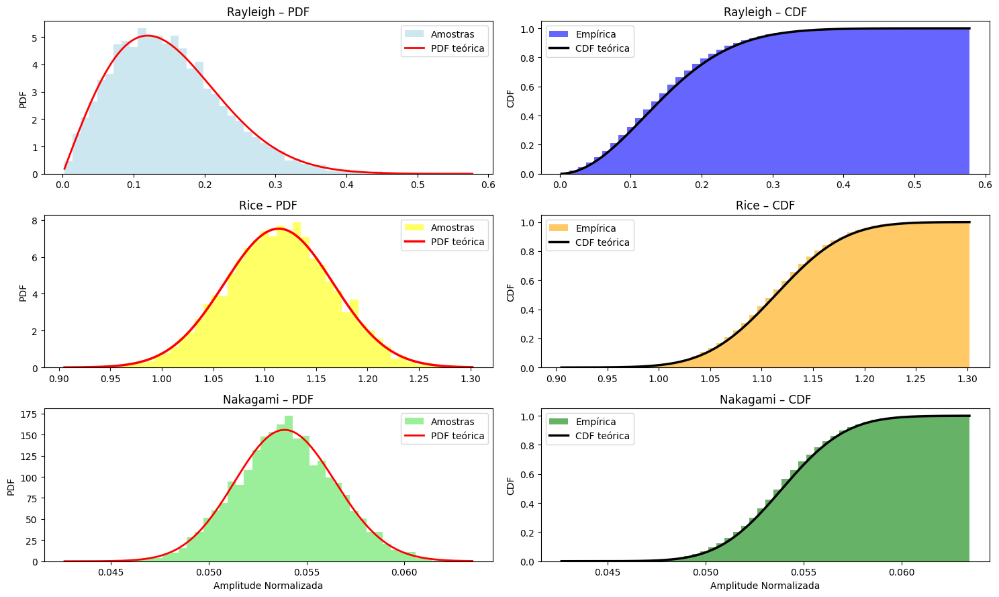

In [513]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import rayleigh, rice, nakagami

# -----------------------------------------------------
# 1. Paramêtros
# -----------------------------------------------------
params_rayleigh = (0, 0.12)        # (loc, scale)
params_rice = (20.99, 0, 0.053)           # (b, loc, scale)
params_nakagami = (110.89, 0, 0.054)   # (m, loc, scale)
n_samples = 5000

# -----------------------------------------------------
# 2. Geração de amostras
# -----------------------------------------------------
R_rayleigh = rayleigh.rvs(loc=params_rayleigh[0],
                          scale=params_rayleigh[1],
                          size=n_samples)
R_rice = rice.rvs(params_rice[0],
                  loc=params_rice[1],
                  scale=params_rice[2],
                  size=n_samples)
R_nakagami = nakagami.rvs(params_nakagami[0],
                          loc=params_nakagami[1],
                          scale=params_nakagami[2],
                          size=n_samples)

# Print - amostras geradas
print(f"Amostras geradas - Rayleigh: {n_samples} amostras. Parâmetros: scale={params_rayleigh[1]:.3f}")
print(f"Amostras geradas - Rice: {n_samples} amostras. Parâmetros: b={params_rice[0]:.3f} e scale={params_rice[2]:.3f}")
print(f"Amostras geradas - Nakagami: {n_samples} amostras. Parâmetros: m={params_nakagami[0]:.3f} e scale={params_nakagami[2]:.3f}")

# -----------------------------------------------------
# 3. Plotting range
# -----------------------------------------------------
x_rayleigh = np.linspace(min(R_rayleigh), max(R_rayleigh), 500)
x_rice = np.linspace(min(R_rice), max(R_rice), 500)
x_nakagami = np.linspace(min(R_nakagami), max(R_nakagami), 500)

# -----------------------------------------------------
# 4. PDFs e CDFs teóricas
# -----------------------------------------------------
pdf_rayleigh = rayleigh.pdf(x_rayleigh, *params_rayleigh)
cdf_rayleigh = rayleigh.cdf(x_rayleigh, *params_rayleigh)

pdf_rice = rice.pdf(x_rice, *params_rice)
cdf_rice = rice.cdf(x_rice, *params_rice)

pdf_nakagami = nakagami.pdf(x_nakagami, *params_nakagami)
cdf_nakagami = nakagami.cdf(x_nakagami, *params_nakagami)

# -----------------------------------------------------
# 5. Plot histogramas e CDFs
# -----------------------------------------------------
plt.figure(figsize=(15, 9))

# --- Rayleigh ---
plt.subplot(3, 2, 1)
plt.hist(R_rayleigh, bins=50, density=True, alpha=0.6, color='lightblue', label='Amostras')
plt.plot(x_rayleigh, pdf_rayleigh, 'r-', lw=2, label='PDF teórica')
plt.ylabel("PDF")
plt.title('Rayleigh – PDF')
plt.legend()

plt.subplot(3, 2, 2)
plt.hist(R_rayleigh, bins=50, density=True, cumulative=True, alpha=0.6, color='blue', label='Empírica')
plt.plot(x_rayleigh, cdf_rayleigh, 'k-', lw=2.5, label='CDF teórica')
plt.ylabel("CDF")
plt.title('Rayleigh – CDF')
plt.legend()

# --- Rice ---
plt.subplot(3, 2, 3)
plt.hist(R_rice, bins=50, density=True, alpha=0.6, color='yellow', label='Amostras')
plt.plot(x_rice, pdf_rice, 'r-', lw=2.5, label='PDF teórica')
plt.ylabel("PDF")
plt.title('Rice – PDF')
plt.legend()

plt.subplot(3, 2, 4)
plt.hist(R_rice, bins=50, density=True, cumulative=True, alpha=0.6, color='orange', label='Empírica')
plt.plot(x_rice, cdf_rice, 'k-', lw=2.5, label='CDF teórica')
plt.ylabel("CDF")
plt.title('Rice – CDF')
plt.legend()

# --- Nakagami ---
plt.subplot(3, 2, 5)
plt.hist(R_nakagami, bins=50, density=True, alpha=0.9, color='lightgreen', label='Amostras')
plt.plot(x_nakagami, pdf_nakagami, 'r-', lw=2, label='PDF teórica')
plt.ylabel("PDF")
plt.xlabel("Amplitude Normalizada")
plt.title('Nakagami – PDF')
plt.legend()

plt.subplot(3, 2, 6)
plt.hist(R_nakagami, bins=50, density=True, cumulative=True, alpha=0.6, color='green', label='Empírica')
plt.plot(x_nakagami, cdf_nakagami, 'k-', lw=2.5, label='CDF teórica')
plt.ylabel("CDF")
plt.xlabel("Amplitude Normalizada")
plt.title('Nakagami – CDF')
plt.legend()

plt.tight_layout()
plt.show()


## Parte II 

### Obtenção do power delay profile (PDP) (8 taps)

In [ ]:
def P_delay(df, cols):
    P_delay = []
    rows = np.arange(0, len(df))
    for tau_k in cols:
            aux = np.mean(df[tau_k].values)
            P_delay.append(aux)
    return P_delay


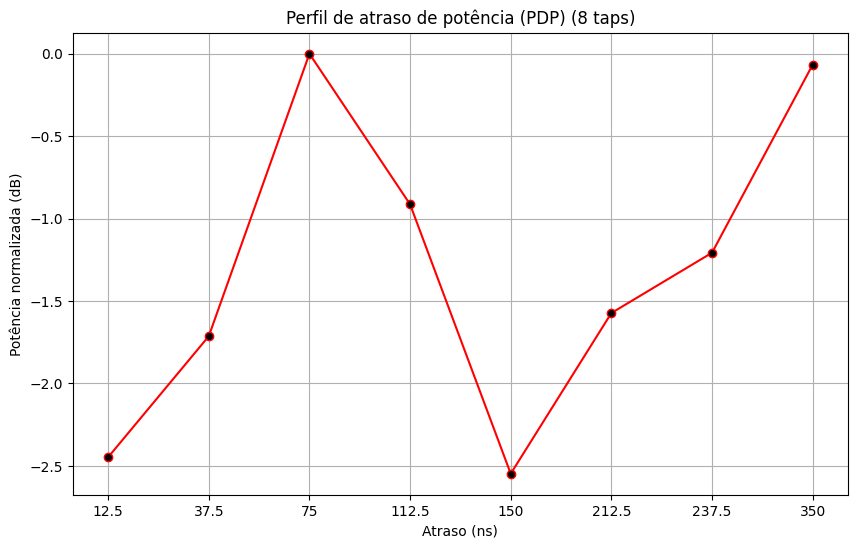

In [520]:
#PDP - média dos quadrados por coluna de atraso
df1 = pd.read_csv(mypath[0])
tau1 = df1.columns

PDP1 = P_delay(df1, tau1)
PDP1_db = 10*np.log10(PDP1/max(PDP1)) # PDP normalizada em dB
plt.figure(figsize=(10,6))
plt.plot(tau1, PDP1_db, color='red', marker='o', markerfacecolor='black')
plt.ylabel("Potência normalizada (dB)")
plt.xlabel("Atraso (ns)")
plt.title("Perfil de atraso de potência (PDP) (8 taps)")
plt.grid(True)
plt.show()

### Obtenção do power delay profile (PDP) (20 taps)

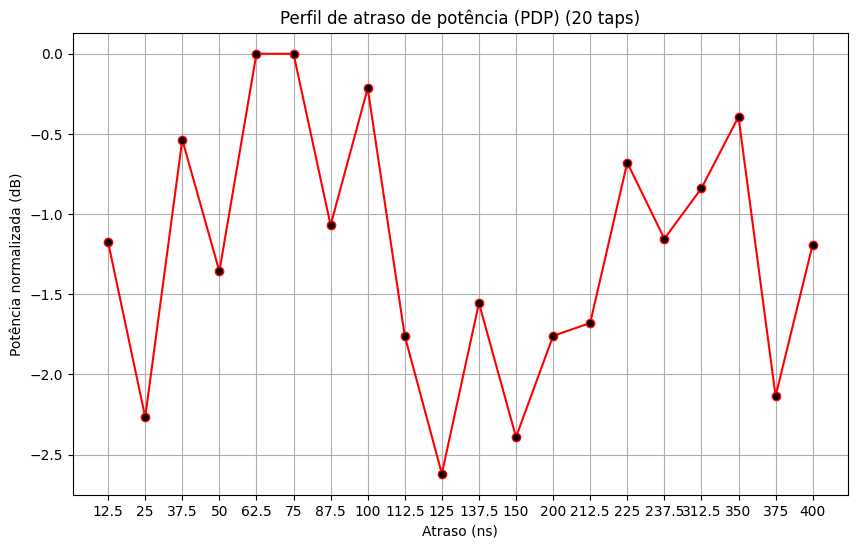

In [518]:
#PDP - média dos quadrados por coluna de atraso
df2 = pd.read_csv(mypath[1])
tau2 = df2.columns
#PDP - média dos quadrados por delay

PDP2 = P_delay(df2, tau2)
PDP2_db = 10*np.log10(PDP2/max(PDP2)) # PDP normalizada em dB
plt.figure(figsize=(10,6))
plt.plot(tau2, PDP2_db, color='red', marker='o', markerfacecolor='black')
plt.ylabel("Potência normalizada (dB)")
plt.xlabel("Atraso (ns)")
plt.title("Perfil de atraso de potência (PDP) (20 taps)")
plt.grid(True)
plt.show()

### Cálculo do RMS Delay Spread, Maximum Excess Delay e Mean Excess Delay (8 taps)

In [425]:
import numpy as np

def MAX_DELAY_SPREAD(df, PDP_db, X):
    """
    Calcular o Maximum Delay Spread
    Tau_x: componente de multipercurso até X dB abaixo do máximo
    Tau_0: primeiro sinal que chega
    """
    tau = np.array(df.columns, dtype=np.float64)
    tau_0 = tau[0]
    print('PDP', PDP_db)
    # Índice do valor máximo
    ind_max = np.argmax(PDP_db)
    val_max = PDP_db[ind_max]
    print ('Valores maxs', val_max)
    # Limiar em dB abaixo do máximo
    limiar = val_max - X

    # Encontrar o índice do primeiro valor abaixo do máximo, ou seja, o mais próximo do limiar
    # (pegamos o valor imediatamente menor que o máximo)
    mask_baixo = PDP_db < val_max # Contornar o valor de valor muito baixo
    print('Mask abaixo', mask_baixo)
    if not np.any(mask_baixo):
        print("Nenhum valor abaixo do máximo foi encontrado.")
        return 0

    # Índice do valor imediatamente abaixo do máximo
    ind_submax = np.where(mask_baixo, PDP_db, -np.inf).argmax()
    print('Indice do valor logo abaixo do maximo', ind_submax)
    val_submax = PDP_db[ind_submax]

    print('Vals submax', val_submax)
    
    # Atraso correspondente ao valor imediatamente abaixo do máximo
    tau_x = tau[ind_submax]
    print('Atraso', tau_x)

    # Maximum Delay Spread
    max_delay_spread = abs(tau_x - tau_0)

    return max_delay_spread


In [402]:
import numpy as np

def MAX_DELAY_SPREAD(df, PDP_db, X):
    """
    Calcular o Maximum Delay Spread
    Tau_x: componente de multipercurso até X dB abaixo do máximo
    Tau_0: primeiro sinal que chega
    """
    tau = np.array(df.columns, dtype=np.float64)
    tau_0 = tau[0]
    print('PDP', PDP_db)

    # Índice do valor máximo
    ind_max = np.argmax(PDP_db)
    val_max = PDP_db[ind_max]
    print ('Valores maxs', val_max)
    # Limiar em dB abaixo do máximo
    limiar = val_max - X

    # Encontrar o índice do primeiro valor abaixo do máximo, ou seja, o mais próximo do limiar
    # (pegamos o valor imediatamente menor que o máximo)
    mask_baixo = PDP_db < val_max
    print('Mask abaixo', mask_baixo)
    if not np.any(mask_baixo):
        print("Nenhum valor abaixo do máximo foi encontrado.")
        return 0

    # Índice do valor imediatamente abaixo do máximo
    ind_submax = np.where(mask_baixo, PDP_db, -np.inf).argmax()
    print('Indice do valor logo abaixo do maximo', ind_submax)
    val_submax = PDP_db[ind_submax]

    print('Vals submax', val_submax)
    
    # Atraso correspondente ao valor imediatamente abaixo do máximo
    tau_x = tau[ind_submax]
    print('Atraso', tau_x)

    # Maximum Delay Spread
    max_delay_spread = abs(tau_x - tau_0)

    return max_delay_spread


In [522]:
def max_delay_spread(pdp, delays, threshold_db=-10):

    P_k = pdp
    tau_k = delays
    
    # Normalizar a potência total para 1 
    P_total = np.sum(P_k)
    p_k = P_k / P_total
    
    # 1. Mean Excess Delay 
    tau_mean = np.sum(p_k * tau_k)
    
    # 2. RMS Delay Spread
    # tau_rms^2 = E[tau^2] - (E[tau])^2
    tau_sq_mean = np.sum(p_k * (tau_k**2))
    tau_rms = np.sqrt(tau_sq_mean - (tau_mean**2))
    
    # 3. Maximum Excess Delay
    # Atraso do primeiro tap (adotando o primeiro atraso)
    tau_0 = tau_k[0]
    
    # Encontrar o limiar em escala linear
    P_max = np.max(P_k)
    threshold_linear = P_max * (10**(threshold_db / 10.0))
    
    # Encontrar o índice do último tap acima do limiar
    indices_acima = np.where(P_k >= threshold_linear)[0]
    if len(indices_acima) == 0:
        tau_max = 0
    else:
        last_index = indices_acima[-1]
        tau_max = tau_k[last_index] - tau_0
        
    return tau_max


In [524]:
# Convertendo o atraso e o perfil de atraso de potência para array
tau1 = np.array(df1.columns, dtype=np.float64)
PDP1 = np.array(PDP1, dtype=np.float64)

# Mean Excess Delay
mean_tau11 = np.sum(tau1 * PDP1) / np.sum(PDP1)
mean_delay1 = mean_tau11 

# Squared Mean Excess Delay
mean_tau12 = np.sum(tau1**2 * PDP1) / np.sum(PDP1)

# RMS Delay Spread
rms_delay1 = np.sqrt(mean_tau12 - mean_tau11**2)

# Maximum Delay Spread
max_delay_spr1 = max_delay_spread(PDP1, tau1)
# -- PRINTS --
print("--- 8 TAPS---")
print(f"Maximum Delay Spread (X=-10 dB): {max_delay_spr1 :.3f} ns")
print(f"Mean Excess Delay: {mean_tau11:.3f} ns")
print(f"Delay RMS Spread {rms_delay1:.3f} s")

--- 8 TAPS---
Maximum Delay Spread (X=-10 dB): 337.500 ns
Mean Excess Delay: 157.814 ns
Delay RMS Spread 110.312 s


### Cálculo do RMS Delay Spread, Maximum Excess Delay e Mean Excess Delay (20 taps)

In [526]:
# Convertendo o atraso e o perfil de atraso de potência para array
tau2 = np.array(df2.columns, dtype=np.float64)
PDP2 = np.array(PDP2, dtype=np.float64)

# Mean Excess Delay
mean_tau21 = np.sum(tau2 * PDP2) / np.sum(PDP2)
mean_delay2 = mean_tau21

# Squared Mean Excess Delay
mean_tau22 = np.sum(tau2**2 * PDP2) / np.sum(PDP2)

# RMS Delay Spread
rms_delay2 = np.sqrt(mean_tau22 - mean_tau21**2)

# Maximum Delay Spread
# Maximum Delay Spread
max_delay_spr2 = max_delay_spread(PDP2, tau2)
# -- PRINTS --
print("--- 8 TAPS---")
print(f"Maximum Delay Spread (X=-10 dB): {max_delay_spr2 :.3f} ns")
print(f"Mean Excess Delay: {mean_tau21:.3f} ns")
print(f"Delay RMS Spread {rms_delay2:.3f} s")

--- 8 TAPS---
Maximum Delay Spread (X=-10 dB): 387.500 ns
Mean Excess Delay: 162.660 ns
Delay RMS Spread 117.719 s


### Gerar plot para um subconjunto de CIRs e montar animação com a variação da CIR (8 taps)

In [437]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# --- Dados e preparação ---
df1 = pd.read_csv(mypath[0])
tau1 = df1.columns.astype(float)
CIR = df1.values
n_frames = 100 # número de frames
CIR_sub = CIR[:n_frames, :]

# Configuração do backend para animações (importante!)
plt.rcParams['animation.html'] = 'jshtml'
plt.ioff()  # Desativa o modo interativo para melhor controle

# Cria figura e eixo
fig, ax = plt.subplots(figsize=(10, 4))
line, = ax.plot(tau1, np.abs(CIR_sub[0, :]), lw=2, color='red')
ax.set_xlim(tau1[0], tau1[-1])
ax.set_ylim(np.nanmin(np.abs(CIR_sub)) * 0.9, np.nanmax(np.abs(CIR_sub)) * 1.1)
ax.set_xlabel("Atraso (ns)")
ax.set_ylabel("Amplitude normalizada")
ax.grid(True)
ax.set_title(f"Evolução da CIR (8 taps) (Frame 1/{n_frames})")

# Função de atualização
def update(frame):
    line.set_ydata(np.abs(CIR_sub[frame, :]))
    ax.set_title(f"Evolução da CIR (8 taps) (Frame {frame+1}/{n_frames})")
    return line,

# Cria a animação
ani1 = animation.FuncAnimation(
    fig=fig,
    func=update,
    frames=n_frames,
    interval=100,  # ms entre frames
    blit=False,    
    repeat=True
)

plt.tight_layout()
#plt.show()
# Exibir a animação como HTML
HTML(ani1.to_jshtml())

# Salvar a animação como GIF
#ani1.save('CIR_8_taps.gif', writer='pillow', fps=10)

### Gerar plot para um subconjunto de CIRs e montar animação com a variação da CIR (20 taps)

In [530]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# --- Dados e preparação ---
df2 = pd.read_csv(mypath[1])
tau2 = df2.columns.astype(float)
CIR = df2.values
n_frames = 100 # número de frames
CIR_sub = CIR[:n_frames, :]

# Configuração do backend para animações (importante!)
plt.rcParams['animation.html'] = 'jshtml'
plt.ioff()  # Desativa o modo interativo para melhor controle

# Cria figura e eixo
fig, ax = plt.subplots(figsize=(10, 4))
line, = ax.plot(tau2, np.abs(CIR_sub[0, :]), lw=2, color='red')
ax.set_xlim(tau2[0], tau2[-1])
ax.set_ylim(np.nanmin(np.abs(CIR_sub)) * 0.9, np.nanmax(np.abs(CIR_sub)) * 1.1)
ax.set_xlabel("Atraso (ns)")
ax.set_ylabel("Amplitude normalizada")
ax.grid(True)
ax.set_title(f"Evolução da CIR (20 taps) (Frame 1/{n_frames})")

# Função de atualização
def update(frame):
    line.set_ydata(np.abs(CIR_sub[frame, :]))
    ax.set_title(f"Evolução da CIR (20 taps) (Frame {frame+1}/{n_frames})")
    return line,

# Cria a animação
ani2 = animation.FuncAnimation(
    fig=fig,
    func=update,
    frames=n_frames,
    interval=100,  # ms entre frames
    blit=False,    
    repeat=True
)

plt.tight_layout()
#plt.show()
#Exibir a animação como HTML
HTML(ani2.to_jshtml())

# Salvar a animação como GIF
#ani2.save('CIR_20_taps.gif', writer='pillow', fps=10)


### Parte III: Gerar modelo Saleh-Valenzuela (SV)
### Criar rotina para gerar CIRs a partir de parâmetros do modelo SV. Mostrar alguns exemplos gerados a partir de diferentes valores dos parâmetros e o que acontece quando cada parâmetro é variado individualmente.

### 8 taps

=== MODELO SALEH-VALENZUELA - COMPARAÇÃO DE PARÂMETROS ===

1. Comparação de Diferentes Cenários


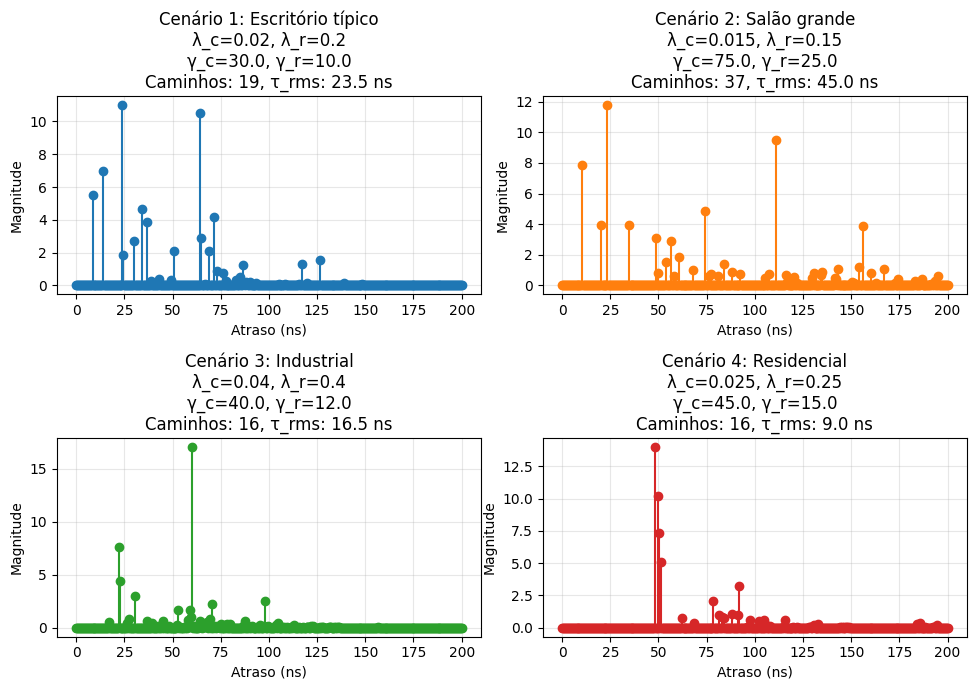


=== COMPARAÇÃO DAS MÉTRICAS POR CENÁRIO ===
Cenário                        Caminho  Atraso (ns)  B_c (MHz)   
-----------------------------------------------------------------
Cenário 1: Escritório típico   19       23.5         6.8         
Cenário 2: Salão grande        37       45.0         3.5         
Cenário 3: Industrial          16       16.5         9.7         
Cenário 4: Residencial         16       9.0          17.7        

2. Análise da Variação Individual de Parâmetros


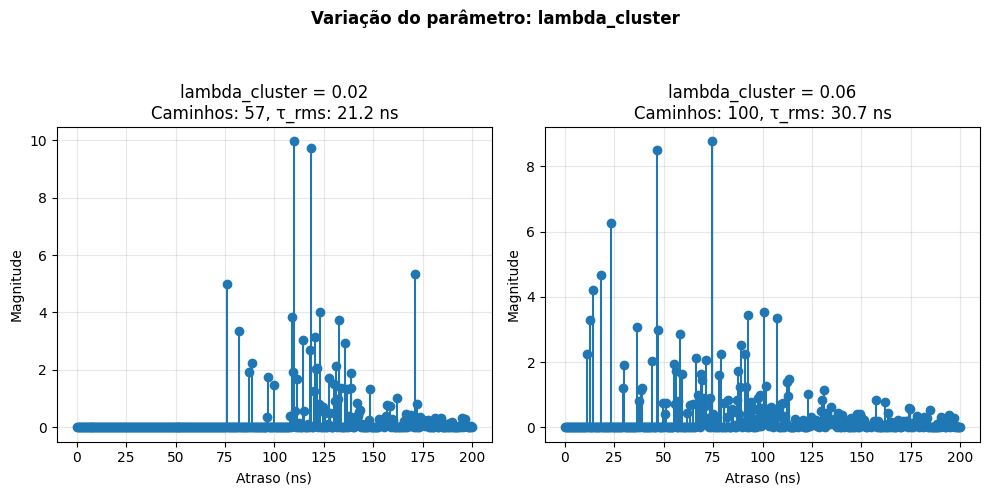

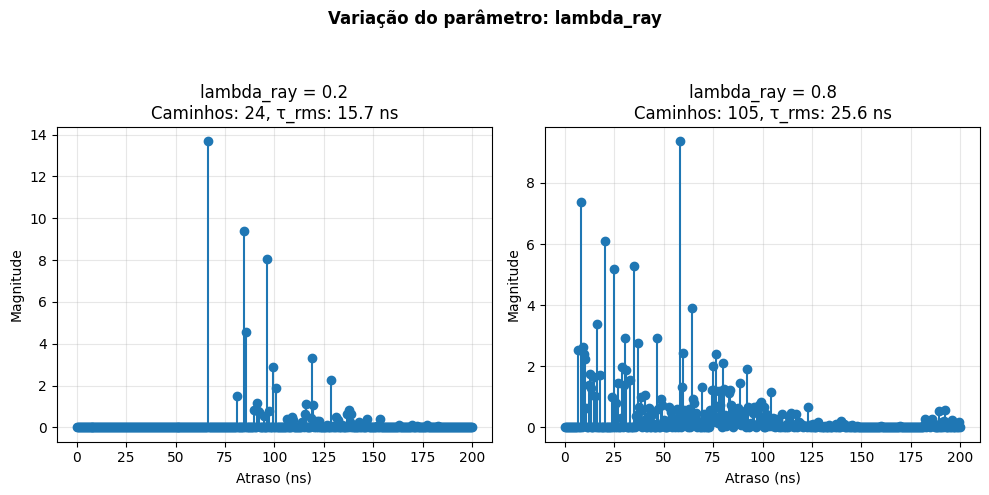

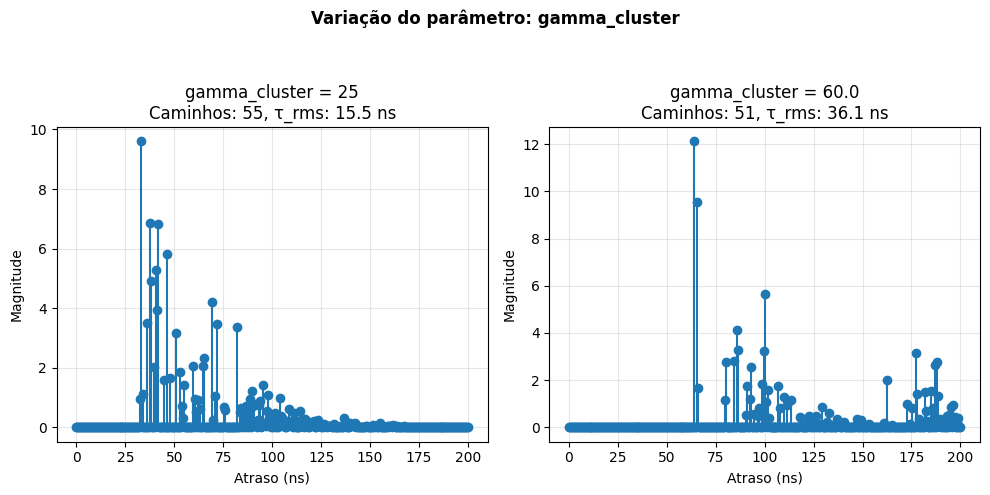

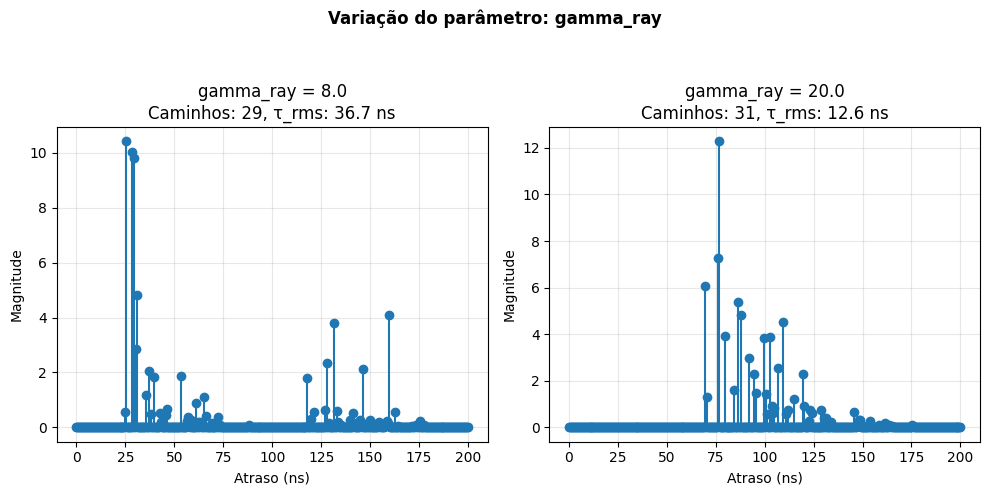

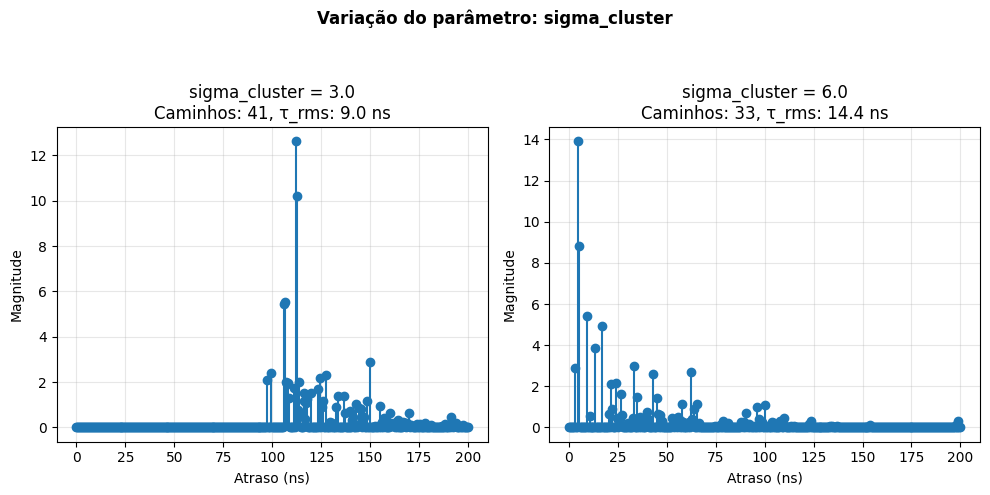

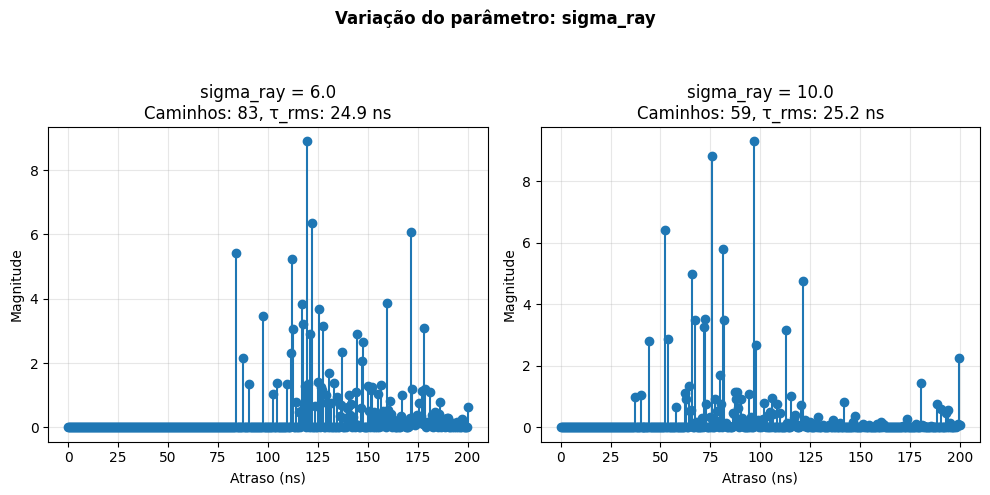


=== ANÁLISE ESTATÍSTICA DOS EFEITOS DOS PARÂMETROS ===

lambda_cluster:
  lambda_cluster = 0.02:
    • Atraso médio: 24.8 ± 9.0 ns
    • Caminhos médios: 42.6 ± 14.2
  lambda_cluster = 0.06:
    • Atraso médio: 27.4 ± 6.5 ns
    • Caminhos médios: 80.1 ± 22.4

lambda_ray:
  lambda_ray = 0.2:
    • Atraso médio: 25.2 ± 8.1 ns
    • Caminhos médios: 41.1 ± 16.8
  lambda_ray = 0.8:
    • Atraso médio: 27.0 ± 7.1 ns
    • Caminhos médios: 97.5 ± 32.1

gamma_cluster:
  gamma_cluster = 25:
    • Atraso médio: 12.1 ± 3.8 ns
    • Caminhos médios: 34.3 ± 14.6
  gamma_cluster = 60.0:
    • Atraso médio: 27.2 ± 7.2 ns
    • Caminhos médios: 59.6 ± 22.1

gamma_ray:
  gamma_ray = 8.0:
    • Atraso médio: 27.0 ± 10.6 ns
    • Caminhos médios: 29.8 ± 11.1
  gamma_ray = 20.0:
    • Atraso médio: 26.0 ± 7.8 ns
    • Caminhos médios: 58.1 ± 19.7

sigma_cluster:
  sigma_cluster = 3.0:
    • Atraso médio: 25.2 ± 7.5 ns
    • Caminhos médios: 56.6 ± 20.8
  sigma_cluster = 6.0:
    • Atraso médio: 27.7 ± 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from typing import List, Tuple, Dict

class SalehValenzuelaChannel:
    """
    Complete implementation of Saleh-Valenzuela model for generating 
    practical channel impulse responses for wireless communications
    """
    
    def __init__(self, 
                 lambda_cluster,
                 lambda_ray,
                 gamma_cluster,
                 gamma_ray,
                 sigma_cluster=3.0,
                 sigma_ray=6.0,
                 sampling_rate=2.0):
        """
        Initialize SV channel model
        
        Parameters:
        lambda_cluster: Cluster arrival rate (clusters/ns)
        lambda_ray: Ray arrival rate within clusters (rays/ns)  
        gamma_cluster: Cluster decay factor (ns)
        gamma_ray: Ray decay factor within clusters (ns)
        sigma_cluster: Cluster log-normal fading (dB)
        sigma_ray: Ray log-normal fading (dB)
        sampling_rate: Sampling rate in GHz
        """
        self.lambda_cluster = lambda_cluster
        self.lambda_ray = lambda_ray
        self.gamma_cluster = gamma_cluster
        self.gamma_ray = gamma_ray
        self.sigma_cluster = sigma_cluster
        self.sigma_ray = sigma_ray
        self.sampling_rate = sampling_rate
        self.dt = 1.0 / sampling_rate  # time resolution in ns
    
    def generate_clusters(self, max_delay: float = 300.0) -> List[float]:
        """Generate cluster arrival times using Poisson process"""
        cluster_times = []
        current_time = 0.0
        
        while current_time < max_delay:
            inter_arrival = np.random.exponential(1.0 / self.lambda_cluster)
            current_time += inter_arrival
            if current_time < max_delay:
                cluster_times.append(current_time)
        
        return cluster_times
    
    def generate_rays_in_cluster(self, cluster_time: float, max_delay: float = 300.0) -> List[float]:
        """Generate ray arrival times within a cluster"""
        ray_times = []
        current_time = 0.0
        
        while current_time + cluster_time < max_delay:
            inter_arrival = np.random.exponential(1.0 / self.lambda_ray)
            current_time += inter_arrival
            if current_time + cluster_time < max_delay:
                ray_times.append(current_time)
        
        return ray_times
    
    def generate_impulse_response(self, 
                                max_delay: float = 300.0,
                                normalize_power: bool = True) -> Tuple[np.ndarray, np.ndarray]:
        """
        Generate complete channel impulse response
        
        Returns:
        h_time: Discrete-time impulse response
        delays: Actual multipath delays
        """
        # Generate multipath components
        cluster_times = self.generate_clusters(max_delay)
        multipath_components = []
        
        for cluster_time in cluster_times:
            ray_times = self.generate_rays_in_cluster(cluster_time, max_delay)
            
            for ray_time in ray_times:
                total_delay = cluster_time + ray_time
                
                # Calculate base amplitude with double exponential decay
                cluster_decay = np.exp(-cluster_time / self.gamma_cluster)
                ray_decay = np.exp(-ray_time / self.gamma_ray)
                base_amplitude = cluster_decay * ray_decay
                
                # Apply log-normal fading
                cluster_fading = 10**(np.random.normal(0, self.sigma_cluster) / 20)
                ray_fading = 10**(np.random.normal(0, self.sigma_ray) / 20)
                amplitude = base_amplitude * cluster_fading * ray_fading
                
                # Random phase
                phase = np.random.uniform(0, 2 * np.pi)
                complex_amplitude = amplitude * np.exp(1j * phase)
                
                multipath_components.append((total_delay, complex_amplitude))
        
        # Convert to discrete-time impulse response
        max_samples = int(max_delay * self.sampling_rate) + 1
        h_time = np.zeros(max_samples, dtype=complex)
        
        for delay, amplitude in multipath_components:
            sample_index = int(round(delay * self.sampling_rate))
            if sample_index < max_samples:
                h_time[sample_index] += amplitude
        
        # Normalize to unit average power if requested
        if normalize_power:
            avg_power = np.mean(np.abs(h_time)**2)
            if avg_power > 0:
                h_time /= np.sqrt(avg_power)
        
        delays = np.arange(len(h_time)) * self.dt
        
        return h_time, delays
    
    def generate_frequency_response(self, 
                                  h_time: np.ndarray,
                                  n_fft: int = 1024) -> Tuple[np.ndarray, np.ndarray]:
        """
        Generate channel frequency response from impulse response
        
        Returns:
        h_freq: Channel frequency response
        frequencies: Frequency axis
        """
        # Zero-pad to FFT length
        h_padded = np.zeros(n_fft, dtype=complex)
        h_padded[:len(h_time)] = h_time
        
        # FFT to get frequency response
        h_freq = np.fft.fft(h_padded)
        frequencies = np.fft.fftfreq(n_fft, d=self.dt*1e-9)  # Convert to Hz
        
        return h_freq, frequencies
    
    def calculate_channel_metrics(self, h_time: np.ndarray) -> Dict:
        """Calculate important channel metrics"""
        delays = np.arange(len(h_time)) * self.dt
        powers = np.abs(h_time)**2
        
        # Remove noise floor for accurate calculations
        power_threshold = 0.001 * np.max(powers)
        valid_indices = powers > power_threshold
        valid_delays = delays[valid_indices]
        valid_powers = powers[valid_indices]
        
        if len(valid_powers) == 0:
            return {
                'rms_delay_spread': 0,
                'mean_delay': 0,
                'max_delay': 0,
                'coherence_bandwidth': np.inf,
                'number_paths': 0
            }
        
        # Mean delay
        mean_delay = np.sum(valid_delays * valid_powers) / np.sum(valid_powers)
        
        # RMS delay spread
        rms_delay_spread = np.sqrt(
            np.sum(valid_powers * (valid_delays - mean_delay)**2) / np.sum(valid_powers)
        )
        
        # Coherence bandwidth (approximate) - handle infinite values
        if rms_delay_spread > 0:
            coherence_bw = 1 / (2 * np.pi * rms_delay_spread * 1e-9)  # in Hz
        else:
            coherence_bw = np.inf
        
        metrics = {
            'rms_delay_spread': rms_delay_spread,
            'mean_delay': mean_delay,
            'max_delay': np.max(valid_delays),
            'coherence_bandwidth': coherence_bw,
            'number_paths': len(valid_powers)
        }
        
        return metrics

def compare_parameter_scenarios():
    """Compare CIRs for different parameter scenarios"""
    
    # Define different parameter scenarios
    scenarios = {
         'Cenário 1: Escritório típico': {
            'lambda_cluster': 0.02,   # 0.01-0.05 clusters/ns
            'lambda_ray': 0.2,        # 0.1-0.5 rays/ns
            'gamma_cluster': 30.0,    # 20-60 ns
            'gamma_ray': 10.0,        # 5-20 ns
            'sigma_cluster': 3.0,     # 2-4 dB
            'sigma_ray': 6.0,         # 4-8 dB
            
        },
        'Cenário 2: Salão grande': {
            'lambda_cluster': 0.015,  # 0.01-0.03 clusters/ns
            'lambda_ray': 0.15,       # 0.1-0.3 rays/ns
            'gamma_cluster': 75.0,    # 50-100 ns
            'gamma_ray': 25.0,        # 15-35 ns
            'sigma_cluster': 3.5,     # 3-5 dB
            'sigma_ray': 7.0,         # 5-9 dB
            
        },
        'Cenário 3: Industrial': {
            'lambda_cluster': 0.04,   # 0.02-0.06 clusters/ns
            'lambda_ray': 0.4,        # 0.2-0.8 rays/ns
            'gamma_cluster': 40.0,    # 25-60 ns
            'gamma_ray': 12.0,        # 8-20 ns
            'sigma_cluster': 4.0,     # 3-6 dB
            'sigma_ray': 8.0,         # 6-10 dB

        },
        'Cenário 4: Residencial': {
            'lambda_cluster': 0.025,  # 0.015-0.04 clusters/ns
            'lambda_ray': 0.25,       # 0.15-0.4 rays/ns
            'gamma_cluster': 45.0,    # 30-70 ns
            'gamma_ray': 15.0,        # 10-25 ns
            'sigma_cluster': 3.2,     # 2.5-4.5 dB
            'sigma_ray': 6.5,         # 5-8 dB
            
        }
    }
    
    # Generate and plot CIRs for each scenario
    n_scenarios = len(scenarios)
    max_delay = 200.0  # ns
    
    fig, axes = plt.subplots(2, 2, figsize=(10, 7))
    axes = axes.flatten()
    
    all_metrics = {}
    
    for idx, (scenario_name, params) in enumerate(scenarios.items()):
        # Create channel with current parameters
        sv_channel = SalehValenzuelaChannel(**params, sampling_rate=2.0)
        
        # Generate impulse response
        h_time, delays = sv_channel.generate_impulse_response(max_delay=max_delay)
        
        # Calculate metrics
        metrics = sv_channel.calculate_channel_metrics(h_time)
        all_metrics[scenario_name] = metrics
        
        # Plot CIR
        ax = axes[idx]
        ax.stem(delays, np.abs(h_time), basefmt=" ", linefmt=f'C{idx}-', markerfmt=f'C{idx}o')
        ax.set_xlabel('Atraso (ns)')
        ax.set_ylabel('Magnitude')
        ax.set_title(f'{scenario_name}\n'
                    f'λ_c={params["lambda_cluster"]}, λ_r={params["lambda_ray"]}\n'
                    f'γ_c={params["gamma_cluster"]}, γ_r={params["gamma_ray"]}\n'
                    f'Caminhos: {metrics["number_paths"]}, τ_rms: {metrics["rms_delay_spread"]:.1f} ns')
        ax.grid(True, alpha=0.3)
        #ax.set_ylim(0, 2)
    
    plt.tight_layout()
    plt.show()
    
    # Print comparative metrics
    print("\n=== COMPARAÇÃO DAS MÉTRICAS POR CENÁRIO ===")
    print(f"{'Cenário':<30} {'Caminho':<8} {'Atraso (ns)':<12} {'B_c (MHz)':<12}")
    print("-" * 65)
    
    for scenario_name, metrics in all_metrics.items():
        coherence_bw = metrics['coherence_bandwidth']
        if np.isfinite(coherence_bw):
            bw_str = f"{coherence_bw/1e6:.1f}"
        else:
            bw_str = "∞"
        
        print(f"{scenario_name:<30} {metrics['number_paths']:<8} {metrics['rms_delay_spread']:<12.1f} {bw_str:<12}")

def analyze_single_parameter_variation():
    """Analyze effect of varying one parameter at a time, with separate figures for each parameter"""

    base_params = {
        'lambda_cluster': 0.033,
        'lambda_ray': 0.33,
        'gamma_cluster': 60.0,
        'gamma_ray': 20.0,
        'sigma_cluster': 3.0,
        'sigma_ray': 6.0,
        'sampling_rate': 2.0
    }

    # variação de parâmetros (valores típicos no ambiente industrial)
    variations = {
        'lambda_cluster': [0.02, 0.06],
        'lambda_ray': [0.2, 0.8],
        'gamma_cluster': [25, 60.0],
        'gamma_ray': [8.0, 20.0],
        'sigma_cluster': [3.0, 6.0],
        'sigma_ray': [6.0, 10.0]
    }

    # Criação de figuras individuais por parâmetro
    for param_name, param_values in variations.items():
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        fig.suptitle(f"Variação do parâmetro: {param_name}", fontsize=12, weight='bold')

        for col, param_value in enumerate(param_values):
            current_params = base_params.copy()
            current_params[param_name] = param_value

            # Geração do canal e métricas
            sv_channel = SalehValenzuelaChannel(**current_params)
            h_time, delays = sv_channel.generate_impulse_response(max_delay=200.0)
            metrics = sv_channel.calculate_channel_metrics(h_time)

            ax = axes[col]
            ax.stem(delays, np.abs(h_time), basefmt=" ")
            ax.set_xlabel('Atraso (ns)')
            ax.set_ylabel('Magnitude')
            ax.grid(True, alpha=0.3)

            #value_label = "baixo" if col == 0 else "alto"
            ax.set_title(f'{param_name} = {param_value}\n'
                         f'Caminhos: {metrics["number_paths"]}, τ_rms: {metrics["rms_delay_spread"]:.1f} ns')

        plt.tight_layout(rect=[0, 0, 1, 0.93])
        plt.show()

    # Análise estatística
    print("\n=== ANÁLISE ESTATÍSTICA DOS EFEITOS DOS PARÂMETROS ===")
    n_realizations = 100

    for param_name, param_values in variations.items():
        print(f"\n{param_name}:")
        for param_value in param_values:
            current_params = base_params.copy()
            current_params[param_name] = param_value

            sv_channel = SalehValenzuelaChannel(**current_params)
            delay_spreads = []
            n_paths = []

            for _ in range(n_realizations):
                h_time, _ = sv_channel.generate_impulse_response()
                metrics = sv_channel.calculate_channel_metrics(h_time)
                delay_spreads.append(metrics['rms_delay_spread'])
                n_paths.append(metrics['number_paths'])

            print(f"  {param_name} = {param_value}:")
            print(f"    • Atraso médio: {np.mean(delay_spreads):.1f} ± {np.std(delay_spreads):.1f} ns")
            print(f"    • Caminhos médios: {np.mean(n_paths):.1f} ± {np.std(n_paths):.1f}")


# MAIN 
if __name__ == "__main__":
    print("=== MODELO SALEH-VALENZUELA - COMPARAÇÃO DE PARÂMETROS ===\n")
    
    print("1. Comparação de Diferentes Cenários")
    compare_parameter_scenarios()
    
    print("\n2. Análise da Variação Individual de Parâmetros")
    analyze_single_parameter_variation()
